# Libraries

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import os

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import plotly.express as px


In [45]:
import catboost as cb
# import load_boston
# from matplotlib import pyplot as pltfrom sklearn.datasets 
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.inspection import permutation_importance

# Data

In [4]:
dir_paths = ['oil.csv','sample_submission.csv', 'holidays_events.csv','stores.csv','train.csv','test.csv','transactions.csv']
all_dfs = {}
for p in dir_paths:
    name_df = p.split('/')[-1].split('.')[0]
    all_dfs[name_df] = pd.read_csv(p)

In [5]:
names_dfs = list(all_dfs.keys())
for n in names_dfs:
    print(n)
    display(all_dfs[n][0:5])

oil


,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20


sample_submission


,id,sales
0,3000888,0.0
1,3000889,0.0
2,3000890,0.0
3,3000891,0.0
4,3000892,0.0


holidays_events


,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


stores


,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


train


,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


test


,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0


transactions


,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922


In [ ]:
display(all_dfs['train'].sort_values(['store_nbr','family', 'date']))

In [203]:
train_hol_df = pd.merge(all_dfs['holidays_events'], all_dfs['train'], on='date', how='right')
train_hol_df['date'] = pd.to_datetime(train_hol_df['date'])

In [178]:
oil_df = all_dfs['oil']
oil_df['date'] = pd.to_datetime(oil_df['date'])

In [199]:
oil_df = pd.merge(oil_df, pd.DataFrame({'date':pd.date_range(start=oil_df['date'].min().strftime('%Y-%m-%d'), end=oil_df['date'].max().strftime('%Y-%m-%d'))}),
                 on='date', how='right')
oil_df['dcoilwtico'] = oil_df['dcoilwtico'].fillna(oil_df['dcoilwtico'].rolling(5,min_periods=1).mean())

In [204]:
train_hol_df = pd.merge(train_hol_df, oil_df, on='date', how='left')

In [208]:
train_hol_df.melt(id_vars='date', value_vars=['dcoilwtico', 'sales'], value_name='oil_vs_sales').sort_values(['oil_vs_sales', 'date'])

,date,variable,oil_vs_sales
3054348,2013-01-01,sales,0.0
3054349,2013-01-01,sales,0.0
3054350,2013-01-01,sales,0.0
3054351,2013-01-01,sales,0.0
3054352,2013-01-01,sales,0.0
...,...,...,...
1777,2013-01-01,dcoilwtico,NaN
1778,2013-01-01,dcoilwtico,NaN
1779,2013-01-01,dcoilwtico,NaN
1780,2013-01-01,dcoilwtico,NaN


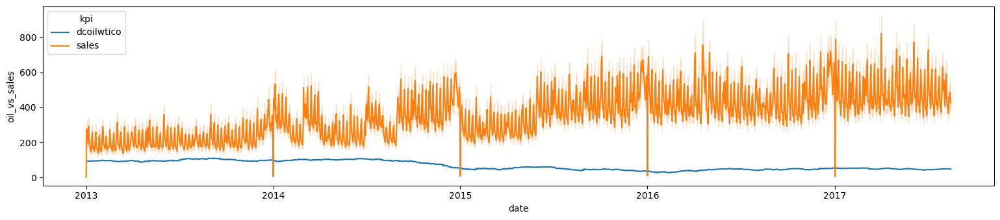

In [209]:
sns.lineplot(train_hol_df.melt(id_vars='date', value_vars=['dcoilwtico', 'sales'], value_name='oil_vs_sales', var_name='kpi').sort_values(['kpi', 'date']), 
             x='date', y='oil_vs_sales', hue='kpi')
plt.show()

In [206]:
train_hol_df.sort_values(['store_nbr', 'family', 'date'])

,date,type,locale,locale_name,description,transferred,id,store_nbr,family,sales,onpromotion,dcoilwtico
0,2013-01-01,Holiday,National,Ecuador,Primer dia del ano,False,0,1,AUTOMOTIVE,0.0,0,NaN
1782,2013-01-02,NaN,NaN,NaN,NaN,NaN,1782,1,AUTOMOTIVE,2.0,0,93.140000
3564,2013-01-03,NaN,NaN,NaN,NaN,NaN,3564,1,AUTOMOTIVE,3.0,0,92.970000
5346,2013-01-04,NaN,NaN,NaN,NaN,NaN,5346,1,AUTOMOTIVE,3.0,0,93.120000
7128,2013-01-05,Work Day,National,Ecuador,Recupero puente Navidad,False,7128,1,AUTOMOTIVE,5.0,0,93.076667
...,...,...,...,...,...,...,...,...,...,...,...,...
3047087,2017-08-11,Transfer,National,Ecuador,Traslado Primer Grito de Independencia,False,2993627,54,SEAFOOD,0.0,0,48.810000
3048869,2017-08-12,NaN,NaN,NaN,NaN,NaN,2995409,54,SEAFOOD,1.0,1,49.002500
3050651,2017-08-13,NaN,NaN,NaN,NaN,NaN,2997191,54,SEAFOOD,2.0,0,48.980000
3052433,2017-08-14,NaN,NaN,NaN,NaN,NaN,2998973,54,SEAFOOD,0.0,0,47.590000


In [273]:
transaction_df = all_dfs['transactions']
transaction_df['date'] = pd.to_datetime(transaction_df['date'])
train_hol_df = pd.merge(train_hol_df, transaction_df, on=['store_nbr','date'], how='left')

In [274]:
train_hol_df.loc[(train_hol_df['transactions'].isnull())&(train_hol_df['sales']==0),'transactions'] = 0

/Users/endamu/anaconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning:

divide by zero encountered in log



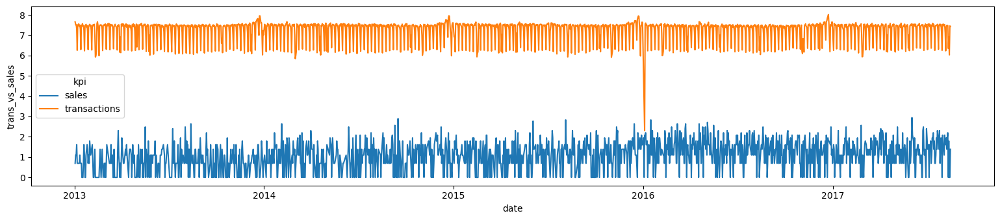

In [277]:
check_trans_df = (train_hol_df.query('store_nbr==1 and family=="AUTOMOTIVE"')
                  .melt(id_vars='date', value_vars=['transactions', 'sales'], 
                               value_name='trans_vs_sales', var_name='kpi'))
(sns.lineplot(check_trans_df.assign(trans_vs_sales=np.log(check_trans_df['trans_vs_sales']))
              .sort_values(['kpi', 'date']), 
             x='date', y='trans_vs_sales', hue='kpi'))
plt.show()

In [289]:
ma_trans.shape

(3054348,)

In [292]:
# train_hol_df.loc[(train_hol_df['transactions'].isnull())].sort_values(['store_nbr', 'family', 'date'])
train_hol_df['ma_trans'] = train_hol_df.groupby(['store_nbr', 'family'], as_index=False)['transactions'].apply(
    lambda x:x.rolling(6,min_periods=3).mean()).values
train_hol_df['transactions'].fillna(train_hol_df['ma_trans'], inplace=True)

In [294]:
# check_trans_df = (train_hol_df.query('store_nbr==1 and family=="AUTOMOTIVE"')
#                   .melt(id_vars='date', value_vars=['transactions', 'sales'], 
#                                value_name='trans_vs_sales', var_name='kpi'))
# (sns.lineplot(check_trans_df.assign(trans_vs_sales=np.log(check_trans_df['trans_vs_sales']))
#               .sort_values(['kpi', 'date']), 
#              x='date', y='trans_vs_sales', hue='kpi'))
# plt.show()

In [316]:
top_selling_fams = (train_hol_df[['family', 'sales']].groupby('family', as_index=False)
 .sum('sales').sort_values('sales', ascending=False)).family.to_list()

In [318]:
# top_selling_fams

In [326]:
# (train_hol_df[['family', 'sales']].groupby('family', as_index=False)
#  .sum('sales').sort_values('sales', ascending=False))

In [7]:
def get_unique(l):
    l = list(l)
    l = np.unique(l)
    return l

In [7]:
# (train_hol_df['date'].max()-train_hol_df['date'].min()).days/365
check_hol_df = train_hol_df.groupby('type', as_index=False).agg({'date':list})
check_hol_df['date'] = check_hol_df['date'].map(lambda x:np.unique(x))

In [8]:
only_holidays_df = train_hol_df.loc[~train_hol_df.type.isna(), ['type','date']].drop_duplicates().sort_values(['type','date'])
only_holidays_df['lower_window'] = -5
only_holidays_df['upper_window'] = 2

In [319]:
train_hol_df.family.unique()

array(['AUTOMOTIVE', 'BABY CARE', 'BEAUTY', 'BEVERAGES', 'BOOKS',
       'BREAD/BAKERY', 'CELEBRATION', 'CLEANING', 'DAIRY', 'DELI', 'EGGS',
       'FROZEN FOODS', 'GROCERY I', 'GROCERY II', 'HARDWARE',
       'HOME AND KITCHEN I', 'HOME AND KITCHEN II', 'HOME APPLIANCES',
       'HOME CARE', 'LADIESWEAR', 'LAWN AND GARDEN', 'LINGERIE',
       'LIQUOR,WINE,BEER', 'MAGAZINES', 'MEATS', 'PERSONAL CARE',
       'PET SUPPLIES', 'PLAYERS AND ELECTRONICS', 'POULTRY',
       'PREPARED FOODS', 'PRODUCE', 'SCHOOL AND OFFICE SUPPLIES',
       'SEAFOOD'], dtype=object)

In [ ]:
g = sns.lineplot(train_hol_df.query('store_nbr==1 and family=="GROCERY I" and date>="2015-02-11" and date<="2015-02-21"'), 
                                x='date', y='sales')
plt.axvline(pd.to_datetime('2015-02-16'), 0)
# g.refline(y = 0,x=pd.to_datetime('2015-02-16'),
#           color = "blue",
#           lw = 3)



In [320]:
fp_train_df = train_hol_df.rename(columns={'sales':'y', 'date':'ds'})
only_holidays_df.rename(columns={'type':'holiday', 'date':'ds'}, inplace=True)
fp_train_df['store_family'] = fp_train_df['store_nbr'].astype(str) + '_' + fp_train_df['family']

In [11]:
def encode_cyclical(df, period, useSine=True):
    """
    returns the sine and cosine of the input value, scaled to the unit interval
    """
    trs1 = 2 * np.pi * df.ds.dt.dayofweek / period
#     input_x = 2 * np.pi * (a / period)
    if useSine:
#         (2 * pi * pl.col("DoW") / 7).sin()
        x = np.sin(trs1)
    else:
        x = np.cos(trs1)
    return x

In [323]:
fp_train_df['DoW_sin'] = encode_cyclical(df=fp_train_df, period=7, useSine=True)
fp_train_df['DoW_cos'] = encode_cyclical(df=fp_train_df, period=7, useSine=False)
fp_train_df['WoY_cos'] = encode_cyclical(df=fp_train_df, period=52, useSine=False)
fp_train_df['WoY_sin'] = encode_cyclical(df=fp_train_df, period=52, useSine=True)

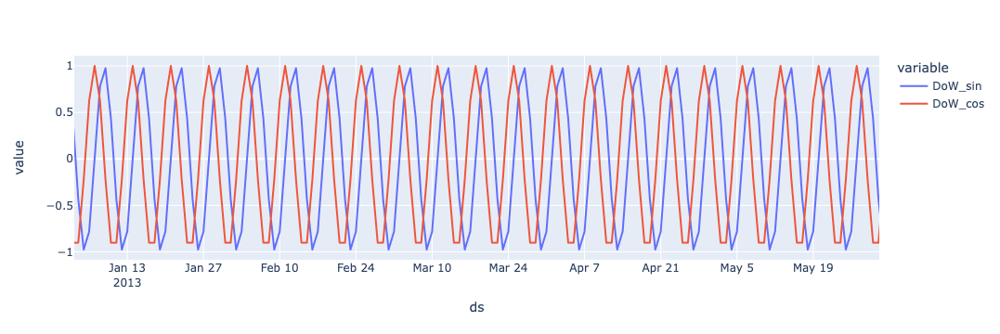

In [249]:
fig = px.line(fp_train_df.query('store_nbr==1 and family=="BEVERAGES"').sort_values('ds'),
              x='ds', y=['DoW_sin','DoW_cos'] )
fig.show()

In [252]:
store_fams = fp_train_df.store_family.unique()

In [330]:
top_selling_strs = (fp_train_df.groupby('store_nbr', as_index=False)
                    .sum('y').sort_values('y', ascending=False)
                    [['store_nbr', 'y']].store_nbr.tolist())

In [324]:
predictors = ['onpromotion', 'dcoilwtico',
       'transactions', 'store_family', 'DoW_sin', 'DoW_cos',
       'WoY_cos', 'WoY_sin']

# Modelling

## Facebook prophet

In [9]:
from prophet import Prophet

In [322]:
# fp_train_df.family.unique()

In [223]:
print(fp_train_df.ds.min())
print(fp_train_df.ds.max())

2013-01-01 00:00:00
2017-08-15 00:00:00


In [14]:
# import random
# store_fam_list = fp_train_df['store_family'].unique()
# random.shuffle(store_fam_list)
# train_index = int(round(len(store_fam_list)*0.8))
# train_list = store_fam_list[0:train_index]
# test_list = store_fam_list[train_index:]

In [238]:
# fp_train_df.loc[fp_train_df['ds']<"2017-05-01 00:00:00"]

In [250]:
def warm_start_params(m):
    """
    Retrieve parameters from a trained model in the format used to initialize a new Stan model.
    Note that the new Stan model must have these same settings:
        n_changepoints, seasonality features, mcmc sampling
    for the retrieved parameters to be valid for the new model.

    Parameters
    ----------
    m: A trained model of the Prophet class.

    Returns
    -------
    A Dictionary containing retrieved parameters of m.
    """
    res = {}
    for pname in ['k', 'm', 'sigma_obs']:
        if m.mcmc_samples == 0:
            res[pname] = m.params[pname][0][0]
        else:
            res[pname] = np.mean(m.params[pname])
    for pname in ['delta', 'beta']:
        if m.mcmc_samples == 0:
            res[pname] = m.params[pname][0]
        else:
            res[pname] = np.mean(m.params[pname], axis=0)
    return res

In [351]:
m.regressor_column_matrix.

<bound method Prophet.regressor_column_matrix of <prophet.forecaster.Prophet object at 0x1a36d62d0>>

In [ ]:
store_fams = fp_train_df.store_family.unique()
store_forecast_dict = {}
# for store_fam in store_fams[0:10]:
store_fam_train = fp_train_df.query('ds<"2017-05-01"')
only_holidays_df = (store_fam_train.loc[~store_fam_train.type.isna(), ['type','ds']]
                    .drop_duplicates().sort_values(['type','ds']))
only_holidays_df['lower_window'] = -5
only_holidays_df['upper_window'] = 2

# m.add_seasonality(name='yearly', period=365, fourier_order=20)
# m.add_seasonality(name='monthly', period=30, fourier_order=12)
# m.add_seasonality(name='weekly', period=7, fourier_order=10)
# m.add_seasonality(name='daily', period=1, fourier_order=15)
models_dict = dict()
for store in top_selling_strs:
        for fam in top_selling_fams[0:10]:
            m = Prophet(holidays = only_holidays_df.rename(columns={'type':'holiday'}),
                    # seasonality_mode = 'multiplicative',
                    # seasonality_prior_scale = 20,
                    # changepoint_prior_scale = 0.1,
                    # holidays_prior_scale = 10,
                   scaling="minmax")

            fit_model = (Prophet().fit(store_fam_train.query(f'store_nbr=={store} and family=="{fam}"')
                                           .sort_values(['store_family','ds'])[['y', 'ds']+predictors])
                            )  # Adding the last day, fitt
            models_dict[str(store) + '_' + fam] = fit_model

    #     forecast = m.predict(fp_train_df[['ds','onpromotion', 'store_family']])


In [392]:
store_forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2013-01-01,8038.614559,4201.524046,10977.145160,8038.614559,8038.614559,-494.515659,-494.515659,-494.515659,-1284.680519,-1284.680519,-1284.680519,790.164860,790.164860,790.164860,0.0,0.0,0.0,7544.098900
1,2013-01-02,8040.954071,4856.672844,11230.116037,8040.954071,8040.954071,-166.389904,-166.389904,-166.389904,-700.560198,-700.560198,-700.560198,534.170294,534.170294,534.170294,0.0,0.0,0.0,7874.564167
2,2013-01-03,8043.293582,2961.936741,9319.757534,8043.293582,8043.293582,-2039.587678,-2039.587678,-2039.587678,-2337.509587,-2337.509587,-2337.509587,297.921908,297.921908,297.921908,0.0,0.0,0.0,6003.705904
3,2013-01-04,8045.633094,3783.214463,10122.499244,8045.633094,8045.633094,-1103.310277,-1103.310277,-1103.310277,-1187.331254,-1187.331254,-1187.331254,84.020978,84.020978,84.020978,0.0,0.0,0.0,6942.322817
4,2013-01-05,8047.972605,7480.638675,14142.036034,8047.972605,8047.972605,2624.605479,2624.605479,2624.605479,2730.106493,2730.106493,2730.106493,-105.501014,-105.501014,-105.501014,0.0,0.0,0.0,10672.578084
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1709,2017-08-11,11642.169863,6403.001190,12779.326398,11631.751643,11651.167962,-2138.428692,-2138.428692,-2138.428692,-1187.331254,-1187.331254,-1187.331254,-951.097437,-951.097437,-951.097437,0.0,0.0,0.0,9503.741171
1710,2017-08-12,11644.528749,10449.730639,16926.899178,11634.010000,11653.652003,1870.810772,1870.810772,1870.810772,2730.106493,2730.106493,2730.106493,-859.295721,-859.295721,-859.295721,0.0,0.0,0.0,13515.339521
1711,2017-08-13,11646.887636,11195.319977,17842.219676,11636.168981,11656.212363,2807.884673,2807.884673,2807.884673,3569.486936,3569.486936,3569.486936,-761.602263,-761.602263,-761.602263,0.0,0.0,0.0,14454.772309
1712,2017-08-14,11649.246523,6677.598795,13394.999387,11638.295449,11658.726647,-1449.333573,-1449.333573,-1449.333573,-789.511871,-789.511871,-789.511871,-659.821702,-659.821702,-659.821702,0.0,0.0,0.0,10199.912951


In [373]:
# store_fams #= store_fam_train.store_family.unique()[0:5]
# str_df
model_store_fams = models_dict.keys()

In [393]:
pred_dict = {}
for store_fam in model_store_fams:
    str_df = fp_train_df.query(f'store_family=="{store_fam}"')
    store_forecast = models_dict[store_fam].predict(str_df[['ds']+predictors])
    store_forecast = store_forecast[["ds", "yhat", "trend", "weekly", "yearly", 
                                    "additive_terms"]]
#     store_forecast['y'] = fp_test_df['y']
    store_forecast['store_family'] = store_fam
    pred_dict[store_fam] = store_forecast

In [375]:
# model_store_fams

In [353]:
store_fams = list(pred_dict.keys())

In [376]:
models_dict[list(model_store_fams)[0]]

In [386]:
pred_dict[list(model_store_fams)[0]]

,ds,yhat,trend,store_family
0,2013-01-01,7544.098900,8038.614559,44_GROCERY I
1,2013-01-02,7874.564167,8040.954071,44_GROCERY I
2,2013-01-03,6003.705904,8043.293582,44_GROCERY I
3,2013-01-04,6942.322817,8045.633094,44_GROCERY I
4,2013-01-05,10672.578084,8047.972605,44_GROCERY I
...,...,...,...,...
1709,2017-08-11,9503.741171,11642.169863,44_GROCERY I
1710,2017-08-12,13515.339521,11644.528749,44_GROCERY I
1711,2017-08-13,14454.772309,11646.887636,44_GROCERY I
1712,2017-08-14,10199.912951,11649.246523,44_GROCERY I


In [382]:
only_holidays_df.query('ds=="2014-12-16"')

,type,ds,lower_window,upper_window


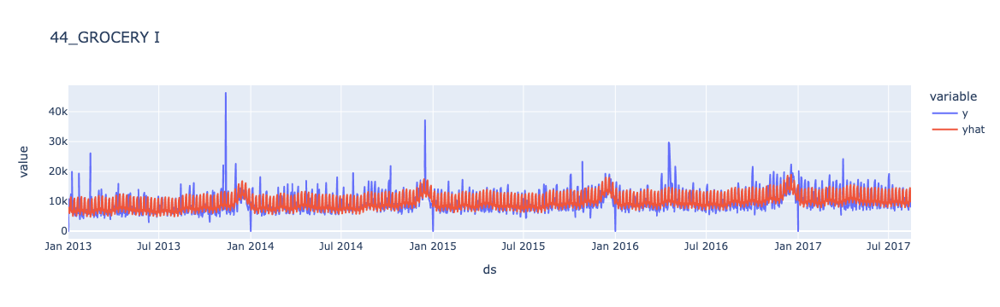

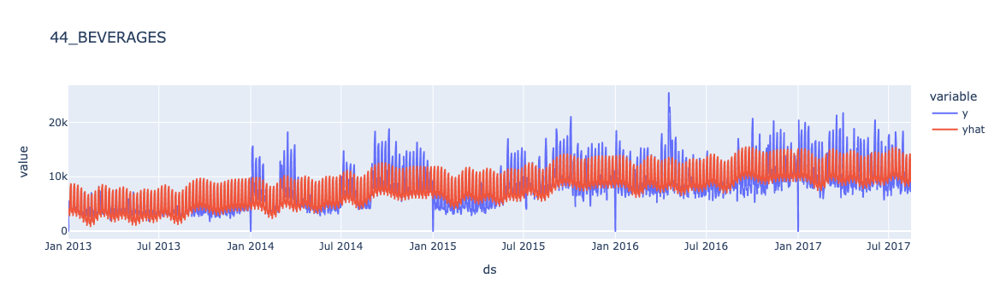

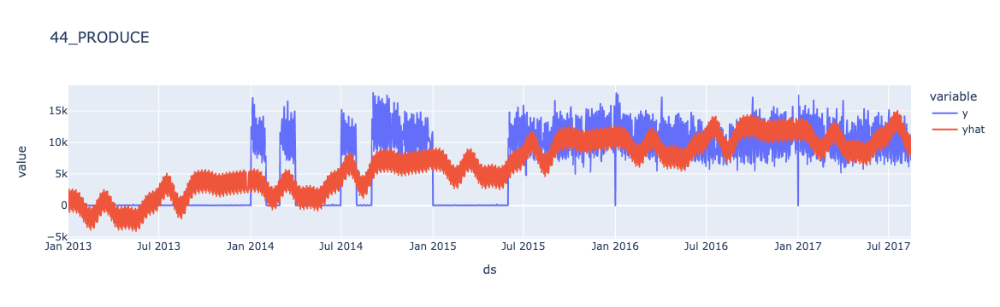

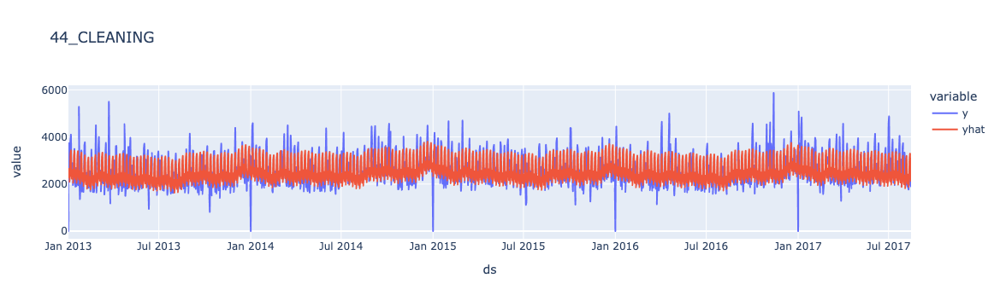

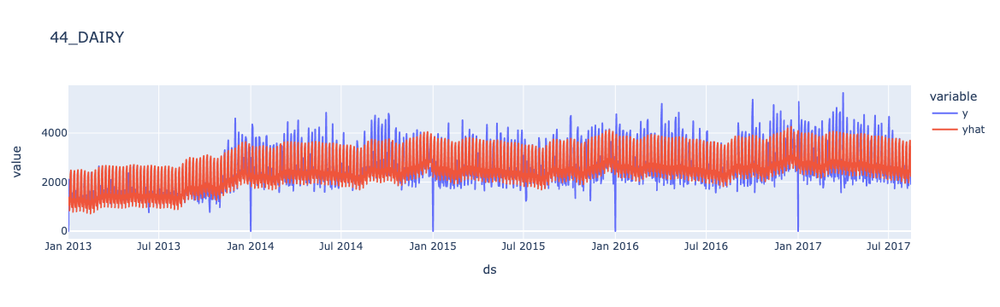

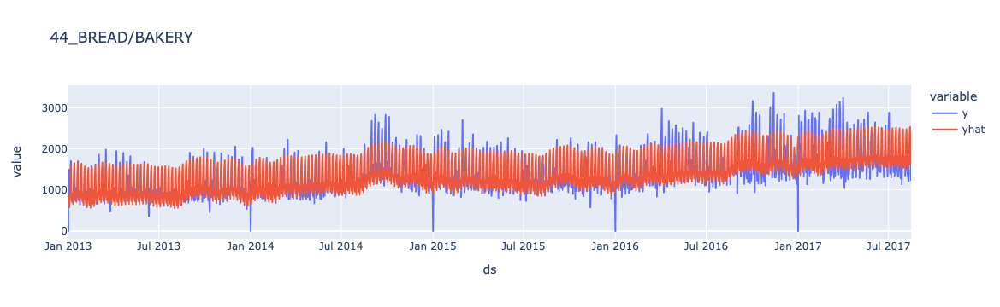

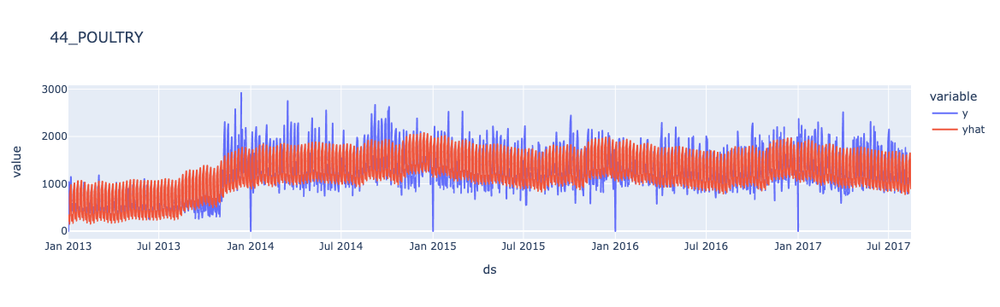

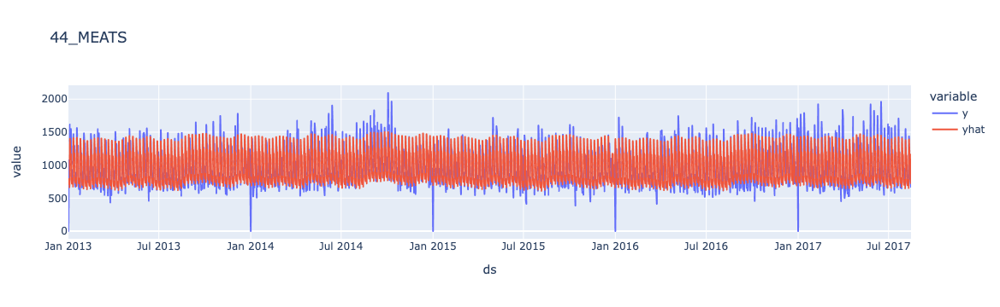

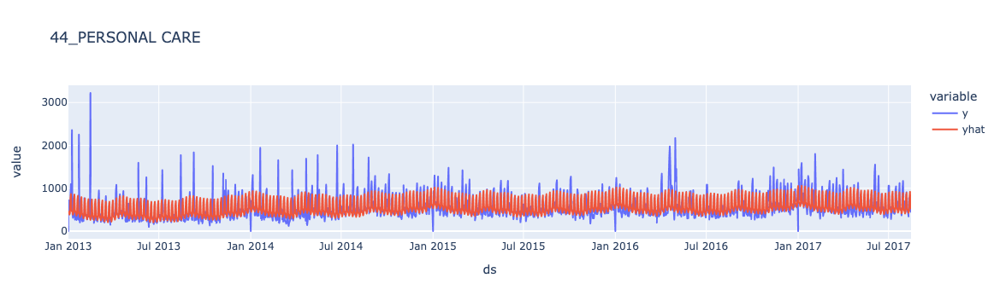

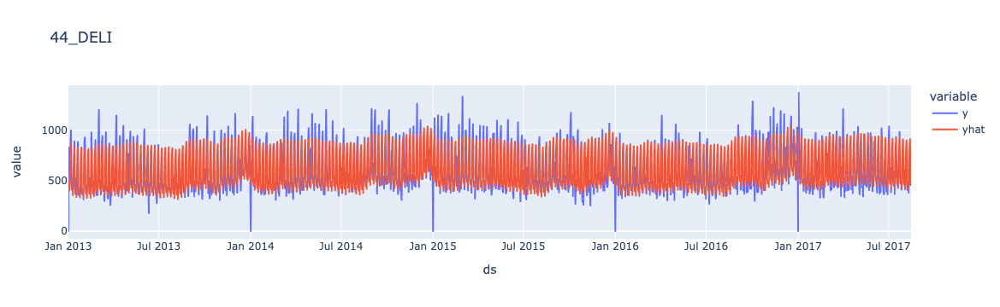

In [383]:
for store_fam in list(pred_dict.keys())[0:10]:
    plt_data = pd.merge(pred_dict[store_fam], 
                        fp_train_df.query(f"store_family=='{store_fam}'")[['ds', 'y']], 
                        on='ds')
    fig = px.line(plt_data, x='ds', y=['y', 'yhat'], title=store_fam)
    fig.show()

In [395]:
pred_dict[store_fam]

,ds,yhat,trend,weekly,yearly,additive_terms,store_family
0,2013-01-01,-4.218188,-0.231541,-1.254051,-2.732596,-3.986647,52_DELI
1,2013-01-02,-4.133274,-0.231052,-1.364812,-2.537410,-3.902222,52_DELI
2,2013-01-03,-3.183118,-0.230563,-0.529944,-2.422611,-2.952555,52_DELI
3,2013-01-04,-1.657617,-0.230074,0.964651,-2.392194,-1.427543,52_DELI
4,2013-01-05,-1.143959,-0.229585,1.533096,-2.447470,-0.914374,52_DELI
...,...,...,...,...,...,...,...
1709,2017-08-11,67.581842,65.076952,0.964651,1.540238,2.504890,52_DELI
1710,2017-08-12,68.693538,65.256458,1.533096,1.903984,3.437080,52_DELI
1711,2017-08-13,69.527556,65.435964,1.883512,2.208080,4.091592,52_DELI
1712,2017-08-14,66.825115,65.615470,-1.232452,2.442097,1.209644,52_DELI


## XGboost

In [404]:
import xgboost as xgb


In [444]:
#get some variables
models_dict = dict()
for store_fam in list(pred_dict.keys()):
    store = int(store_fam.split('_')[0])
    family = store_fam.split('_')[1]
    hol_dumm_df = (pd.get_dummies(train_hol_df
                                  .query(f'store_nbr=={store} and family=="{family}" and date<"2017-05-01"')
                                  [['date', 'type', ]],
                                  columns=['type'], dtype=int).rename(columns={'date':'ds'}))
    df_xgb = pred_dict[store_fam].loc[:, ["ds","trend", "weekly", "yearly", "additive_terms"]]
    df_xgb = pd.merge(hol_dumm_df, df_xgb, on='ds')
    target_df = fp_train_df.query(f'store_nbr=={store} and family=="{family}" and ds<"2017-05-01"')[['ds', 'y']]
    df_xgb = pd.merge(df_xgb, target_df, on='ds')
    
    xgb_model = xgb.XGBRegressor()
    xgb_model.fit(df_xgb.iloc[:,1:-2].values, df_xgb.iloc[:,-1].values,)
    models_dict[store_fam] = xgb_model

In [452]:
train_hol_df.query(f'store_nbr=={store} and family=="{family}"')#[['date', 'y']]

,date,type,locale,locale_name,description,transferred,id,store_nbr,family,sales,onpromotion,dcoilwtico,transactions,ma_trans
1266,2013-01-01,Holiday,National,Ecuador,Primer dia del ano,False,1266,44,GROCERY I,0.0,0,NaN,0.0,1551.000000
3048,2013-01-02,NaN,NaN,NaN,NaN,NaN,3048,44,GROCERY I,10686.0,0,93.140000,4821.0,1677.500000
4830,2013-01-03,NaN,NaN,NaN,NaN,NaN,4830,44,GROCERY I,7342.0,0,92.970000,3618.0,1441.000000
6612,2013-01-04,NaN,NaN,NaN,NaN,NaN,6612,44,GROCERY I,7250.0,0,93.120000,4169.0,1779.833333
8394,2013-01-05,Work Day,National,Ecuador,Recupero puente Navidad,False,8394,44,GROCERY I,10699.0,0,93.076667,4921.0,1662.166667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3046704,2017-08-11,Transfer,National,Ecuador,Traslado Primer Grito de Independencia,False,2993244,44,GROCERY I,9979.0,38,48.810000,4418.0,843.833333
3048486,2017-08-12,NaN,NaN,NaN,NaN,NaN,2995026,44,GROCERY I,9391.0,39,49.002500,4277.0,907.333333
3050268,2017-08-13,NaN,NaN,NaN,NaN,NaN,2996808,44,GROCERY I,9811.0,41,48.980000,4392.0,839.833333
3052050,2017-08-14,NaN,NaN,NaN,NaN,NaN,2998590,44,GROCERY I,8318.0,39,47.590000,4039.0,791.500000


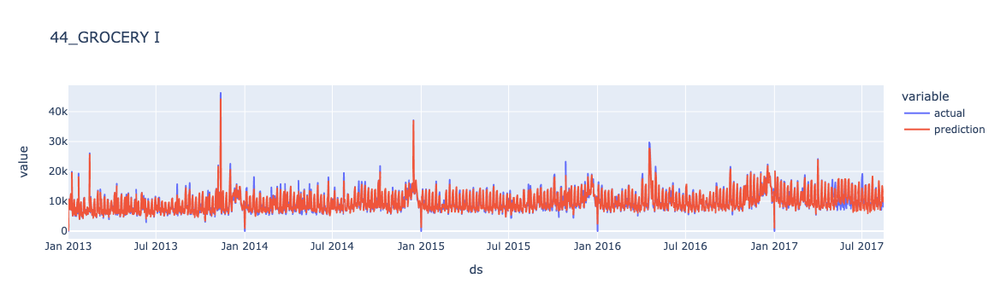

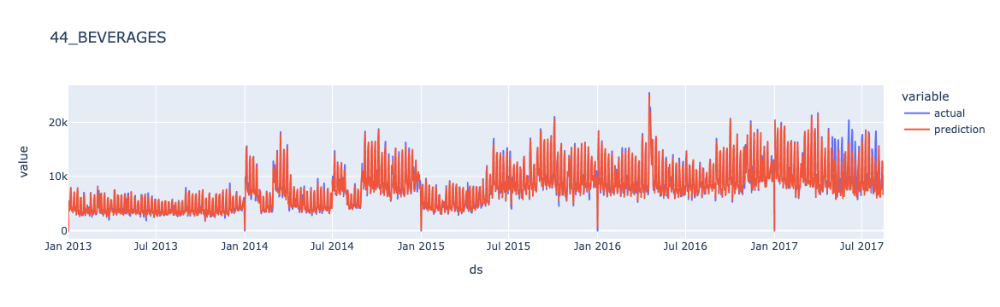

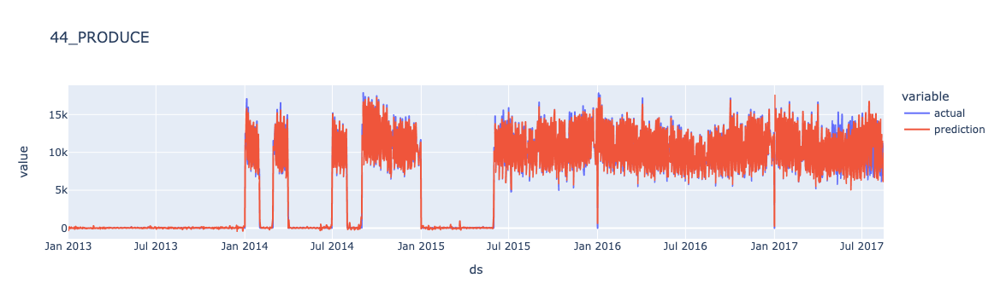

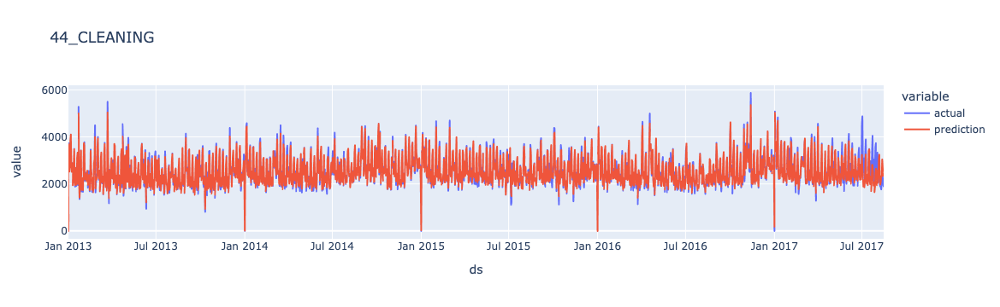

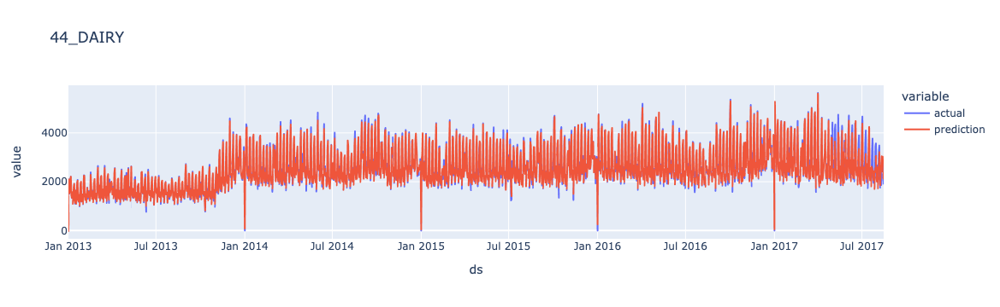

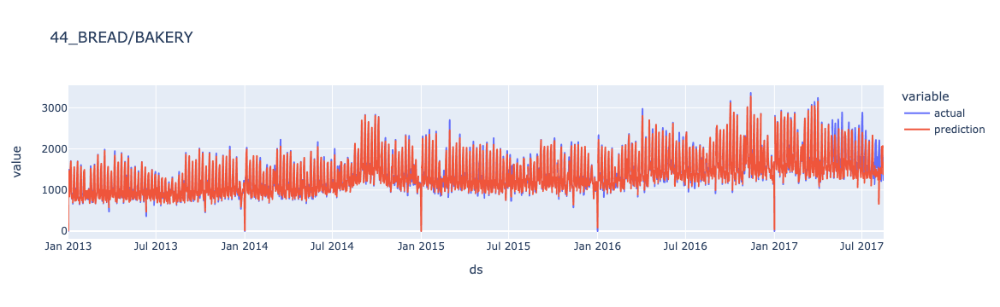

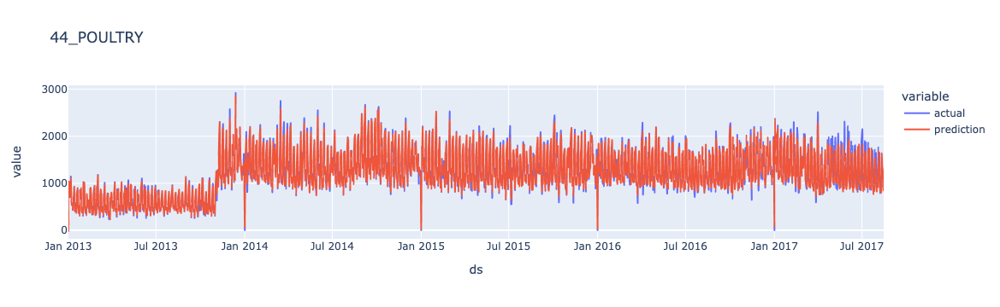

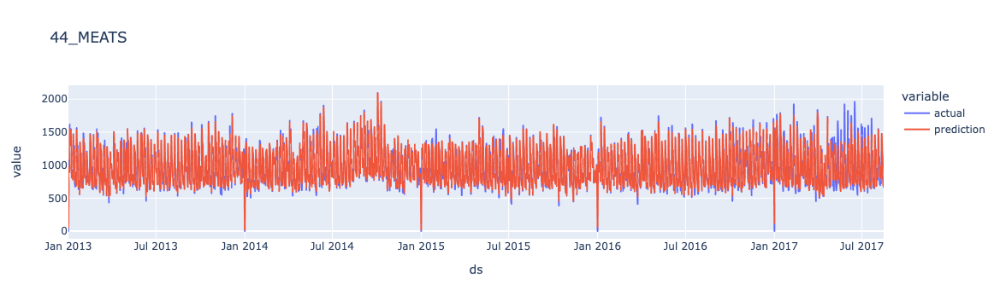

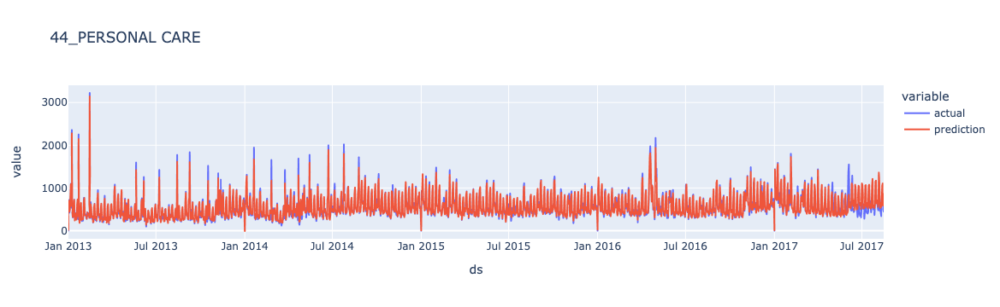

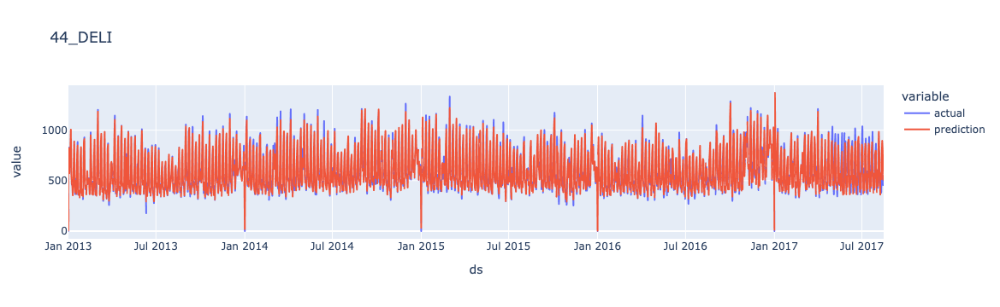

In [485]:
for store_fam in list(pred_dict.keys())[0:10]:
    store = int(store_fam.split('_')[0])
    family = store_fam.split('_')[1]
    df_xgb = pred_dict[store_fam].loc[:, ["ds","trend", "weekly", "yearly", "additive_terms"]]
    hol_dumm_df = (pd.get_dummies(train_hol_df
                                  .query(f'store_nbr=={store} and family=="{family}"')
                                  [['date', 'type', ]],
                                  columns=['type'], dtype=int).rename(columns={'date':'ds'}))
    df_xgb = pd.merge(hol_dumm_df, df_xgb, on='ds')
    
    yhat = models_dict[store_fam].predict(df_xgb.iloc[:,1:-1].values)
    pred_df = pd.DataFrame({'prediction':yhat,
                           'ds': df_xgb.ds.values})
    pred_df['store_family'] = store_fam
    pred_df = pd.merge(pred_df,
                       fp_train_df.query(f'store_nbr=={store} and family=="{family}"')[['y','ds']],
                      on='ds', how='right')
    
    fig = px.line(pred_df.rename(columns={'y':'actual'}), x='ds', y=['actual','prediction'], title=store_fam)
    fig.show()

In [436]:
pred_df

,prediction,actual,ds,store_family
0,-0.002119,0.000,2013-01-01,52_DELI
1,-0.003653,0.000,2013-01-02,52_DELI
2,-0.000012,0.000,2013-01-03,52_DELI
3,-0.000757,0.000,2013-01-04,52_DELI
4,0.001532,0.000,2013-01-05,52_DELI
...,...,...,...,...
1979,497.043945,497.079,2017-08-11,52_DELI
1980,381.177948,381.137,2017-08-12,52_DELI
1981,435.754181,435.742,2017-08-13,52_DELI
1982,274.704559,274.628,2017-08-14,52_DELI


In [45]:
Train = xgb.DMatrix(df_xgb.iloc[:,1:-1], label = df_xgb.y)

Test = xgb.DMatrix(df_xgb.iloc[:,1:-1], label = df_xgb.y)

In [32]:
# set the parameters
parameters = {'learning_rate': 0.3,
              'max_depth': 6,
              'colsample_bytree': 1,
              'subsample': 1,
              'min_child_weight' : 1,
              'gamma': 0,
              'random_state': 1502,
              'eval_metric': "rmse",
              'objective': "reg:squarederror"}

In [ ]:
model = xgb.train(params = parameters,
                  dtrain = Train,
                  num_boost_round = 40,
                  evals = [(Test, "y")])

In [51]:
predictions = pd.Series(model.predict(Test), name = "XGBoost")
predictions_df = pd.DataFrame({'ds':df_xgb.ds.values,
                              'yhat':predictions.values})

In [54]:
plt_xgb_df = pd.concat([predictions_df, df_xgb.y], axis=1)

In [55]:
fig = px.line(plt_xgb_df, x='ds', y=['y', 'yhat'])
fig.show()

## Catboost

In [493]:
fp_pred_dfs = [v[["ds","trend", "weekly", "yearly", "additive_terms", "store_family"]] for k, v in pred_dict.items()]
fp_pred_df = pd.concat(fp_pred_dfs)

In [494]:
# pred_dict[store_fam]
fp_pred_df

,ds,trend,weekly,yearly,additive_terms,store_family
0,2013-01-01,8038.614559,-1284.680519,790.164860,-494.515659,44_GROCERY I
1,2013-01-02,8040.954071,-700.560198,534.170294,-166.389904,44_GROCERY I
2,2013-01-03,8043.293582,-2337.509587,297.921908,-2039.587678,44_GROCERY I
3,2013-01-04,8045.633094,-1187.331254,84.020978,-1103.310277,44_GROCERY I
4,2013-01-05,8047.972605,2730.106493,-105.501014,2624.605479,44_GROCERY I
...,...,...,...,...,...,...
1709,2017-08-11,65.076952,0.964651,1.540238,2.504890,52_DELI
1710,2017-08-12,65.256458,1.533096,1.903984,3.437080,52_DELI
1711,2017-08-13,65.435964,1.883512,2.208080,4.091592,52_DELI
1712,2017-08-14,65.615470,-1.232452,2.442097,1.209644,52_DELI


In [495]:
predictors

['onpromotion',
 'dcoilwtico',
 'transactions',
 'store_family',
 'DoW_sin',
 'DoW_cos',
 'WoY_cos',
 'WoY_sin']

In [498]:
print(fp_pred_df.columns)

Index(['ds', 'trend', 'weekly', 'yearly', 'additive_terms', 'store_family'], dtype='object')


In [500]:
catboost_df = pd.merge(fp_pred_df, fp_train_df, on=['store_family', 'ds'], how='right')
train_dataset = (cb.Pool(catboost_df
                         .query(f'family in {tuple(top_selling_fams[0:10])} and ds<"2017-05-01"')
                         [predictors+['trend', 'weekly', 'yearly', 'additive_terms']],
                        catboost_df
                         .query(f'family in {tuple(top_selling_fams[0:10])} and ds<"2017-05-01"')['y'],
                cat_features=['store_family']))
cat_model = cb.CatBoostRegressor(loss_function='RMSE', cat_features = ['store_family']) 

In [464]:
fp_train_df.columns

Index(['ds', 'type', 'locale', 'locale_name', 'description', 'transferred',
       'id', 'store_nbr', 'family', 'y', 'onpromotion', 'dcoilwtico',
       'transactions', 'ma_trans', 'store_family', 'DoW_sin', 'DoW_cos',
       'WoY_cos', 'WoY_sin'],
      dtype='object')

In [501]:
grid = {'iterations': [100, 150, 200],
        'learning_rate': [0.001, 0.03, 0.1],
        'depth': [2, 4, 6, 8],
        'l2_leaf_reg': [0.2, 0.5, 1, 3]}
cat_model.grid_search(grid, train_dataset, verbose=False)

0:	learn: 2083.9512944	test: 2064.4397172	best: 2064.4397172 (0)	total: 181ms	remaining: 17.9s
1:	learn: 2082.3712297	test: 2062.8482449	best: 2062.8482449 (1)	total: 269ms	remaining: 13.2s
2:	learn: 2080.8283701	test: 2061.2903938	best: 2061.2903938 (2)	total: 319ms	remaining: 10.3s
3:	learn: 2079.2627747	test: 2059.7121718	best: 2059.7121718 (3)	total: 358ms	remaining: 8.6s
4:	learn: 2077.6834905	test: 2058.1190570	best: 2058.1190570 (4)	total: 415ms	remaining: 7.88s
5:	learn: 2076.1361283	test: 2056.5568662	best: 2056.5568662 (5)	total: 454ms	remaining: 7.11s
6:	learn: 2074.5977451	test: 2055.0025686	best: 2055.0025686 (6)	total: 496ms	remaining: 6.59s
7:	learn: 2073.0463687	test: 2053.4380306	best: 2053.4380306 (7)	total: 523ms	remaining: 6.01s
8:	learn: 2071.5080047	test: 2051.8863297	best: 2051.8863297 (8)	total: 558ms	remaining: 5.64s
9:	learn: 2069.9345429	test: 2050.3008604	best: 2050.3008604 (9)	total: 604ms	remaining: 5.43s
10:	learn: 2068.4065908	test: 2048.7579067	best: 20

{'params': {'depth': 8,
  'learning_rate': 0.1,
  'l2_leaf_reg': 0.2,
  'iterations': 200},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               4

In [484]:
# r2_list

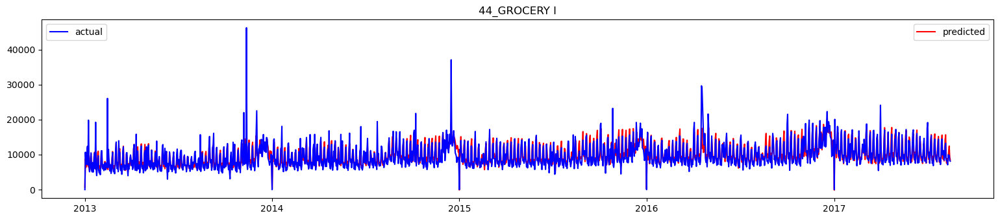

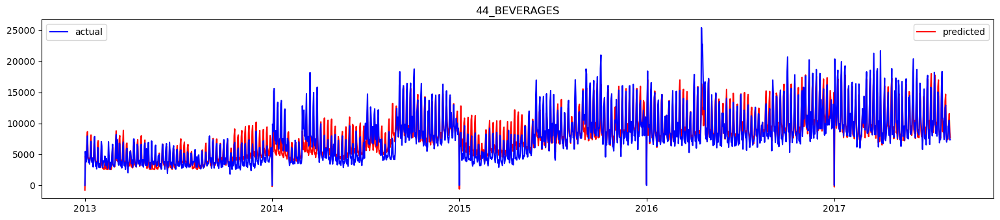

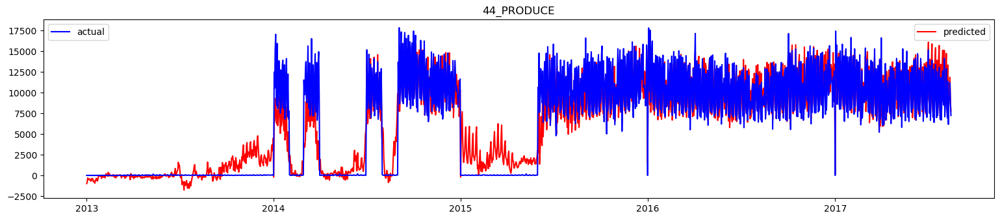

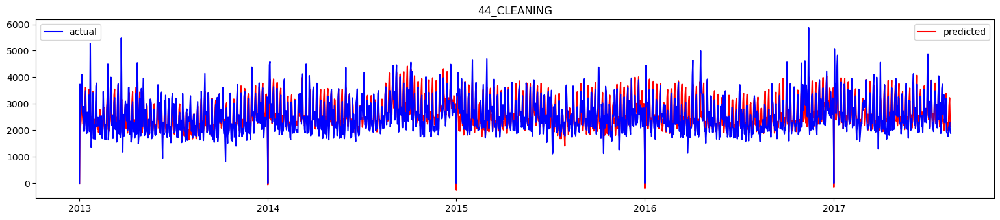

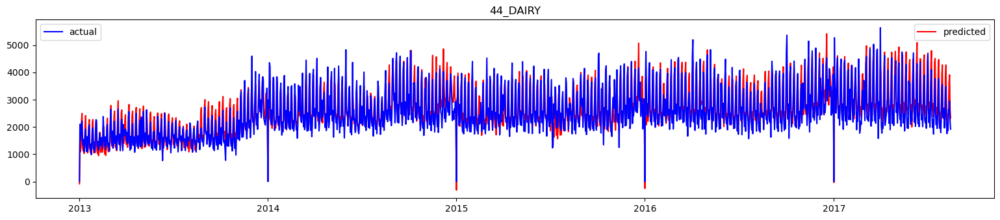

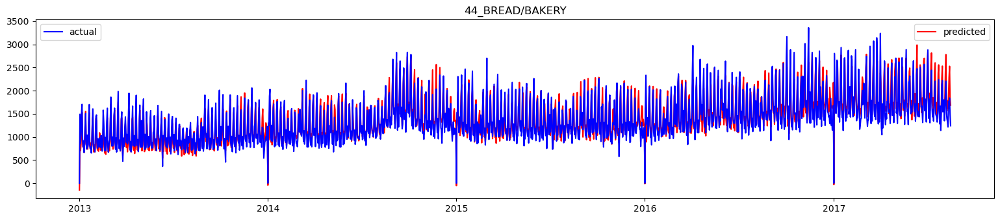

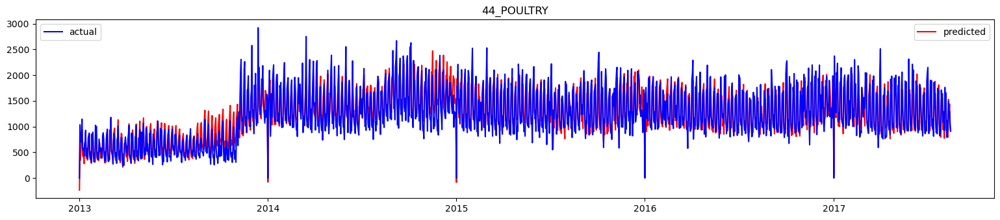

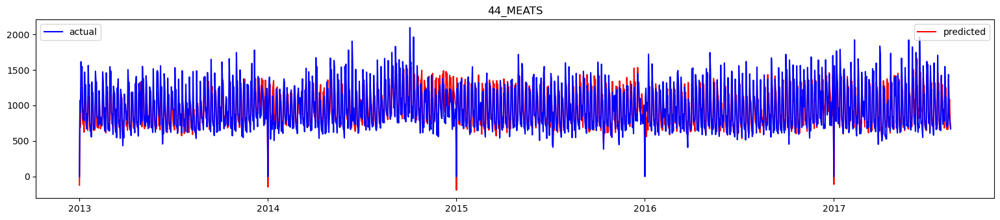

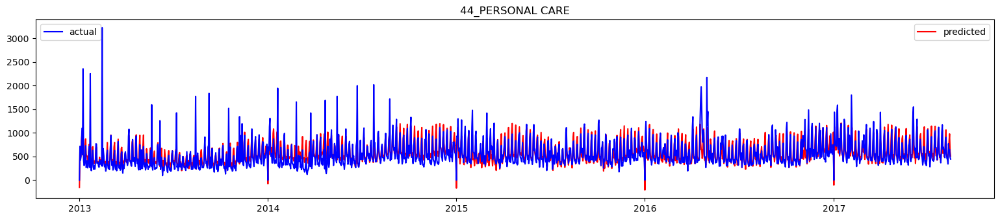

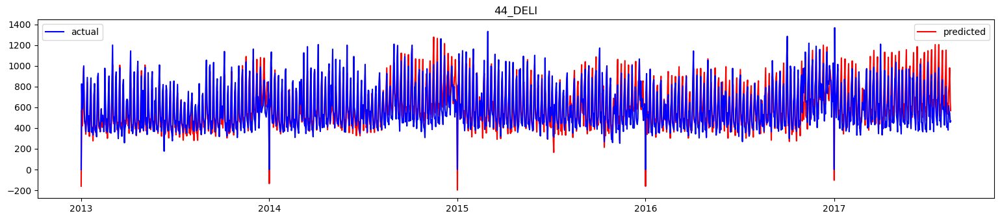

RMSE:  271.2022661188851
R2:  0.6316047447023485


In [503]:

rmse_list = []
r2_list = []
i = 0
for store in top_selling_strs:
    for fam in top_selling_fams[0:10]:
        nn_data_ts = (catboost_df.query(f'family=="{fam}" and store_nbr=={store}')
                          [predictors+['trend', 'weekly', 'yearly', 'additive_terms']])
        targ_ts = (catboost_df.query(f'family== "{fam}" and store_nbr=={store}')
                      ['y'])
        dates_df = catboost_df.query(f'family== "{fam}" and store_nbr=={store}')[['store_family','ds']]
        # test_dataset = cb.Pool(nn_data_ts, targ_ts)
        pred = list(cat_model.predict(nn_data_ts).reshape(-1))
        rmse = (np.sqrt(mean_squared_error(targ_ts, pred)))
        y_test = list(targ_ts)
        r2 = r2_score(y_test, pred)
        rmse_list.append(rmse)
        r2_list.append(r2)
        _pred_df = pd.DataFrame({'actual':list(targ_ts),
                     'prediction':list(pred)})
        # _pred_df['store_family'] = train_list[i]
        # break
        _pred_df['ds'] = dates_df['ds'].values
        # break
        _pred_df = _pred_df.sort_values('ds')
        # break
        if i<10:
            plt.rcParams["figure.figsize"] = [15.50, 3.50]
            plt.rcParams["figure.autolayout"] = True
            line1, = plt.plot(_pred_df['ds'], _pred_df['prediction'], '-r', label='predicted')
            line2, = plt.plot(_pred_df['ds'], _pred_df['actual'], '-b', label='actual')
            first_legend = plt.legend(handles=[line1], loc='upper right')
            plt.gca().add_artist(first_legend)
            plt.legend(handles=[line2], loc='upper left')
            plt.title(str(store)+ '_' + fam)
            plt.show()
            
        i = i + 1
    # break
print('RMSE: ', np.mean(rmse_list))
print('R2: ', np.mean(r2_list))


## LightGBM

In [507]:
import lightgbm as lgbm
from lightgbm import LGBMRegressor 

In [508]:
lgbm_model = LGBMRegressor(metric='rmse' catboost_df) 

In [532]:
assert len(store_fams)== len(np.unique(catboost_df['store_family']))
index = 1
for store_fam in store_fams:
    catboost_df.loc[catboost_df['store_family']==store_fam, 'store_family_index'] = index
    index = index + 1

In [533]:
catboost_df.head()

,ds,trend,weekly,yearly,additive_terms,store_family,type,locale,locale_name,description,...,y,onpromotion,dcoilwtico,transactions,ma_trans,DoW_sin,DoW_cos,WoY_cos,WoY_sin,store_family_index
0,2013-01-01,NaN,NaN,NaN,NaN,1_AUTOMOTIVE,Holiday,National,Ecuador,Primer dia del ano,...,0.0,0,NaN,0.0,NaN,0.781831,0.62349,0.992709,0.120537,1.0
1,2013-01-01,NaN,NaN,NaN,NaN,1_BABY CARE,Holiday,National,Ecuador,Primer dia del ano,...,0.0,0,NaN,0.0,NaN,0.781831,0.62349,0.992709,0.120537,2.0
2,2013-01-01,NaN,NaN,NaN,NaN,1_BEAUTY,Holiday,National,Ecuador,Primer dia del ano,...,0.0,0,NaN,0.0,1314.666667,0.781831,0.62349,0.992709,0.120537,3.0
3,2013-01-01,829.263078,49.810845,92.695901,142.506746,1_BEVERAGES,Holiday,National,Ecuador,Primer dia del ano,...,0.0,0,NaN,0.0,1451.750000,0.781831,0.62349,0.992709,0.120537,4.0
4,2013-01-01,NaN,NaN,NaN,NaN,1_BOOKS,Holiday,National,Ecuador,Primer dia del ano,...,0.0,0,NaN,0.0,1463.200000,0.781831,0.62349,0.992709,0.120537,5.0


In [536]:
predictors_lgbm = ['onpromotion',
 'dcoilwtico',
 'transactions',
 'store_family_index',
 'DoW_sin',
 'DoW_cos',
 'WoY_cos',
 'WoY_sin']

In [563]:
X_train = (catboost_df.query(f'family in {tuple(top_selling_fams[0:10])} and ds<"2017-01-01"')
                         [predictors_lgbm+['trend', 'weekly', 'yearly', 'additive_terms']])
y_train = (catboost_df.query(f'family in {tuple(top_selling_fams[0:10])} and ds<"2017-01-01"')['y'])
X_validate = (catboost_df.query(f'family in {tuple(top_selling_fams[0:10])} and ds>="2017-01-01" and ds<"2017-05-01"')
                         [predictors_lgbm+['trend', 'weekly', 'yearly', 'additive_terms']])
y_validate = (catboost_df.query(f'family in {tuple(top_selling_fams[0:10])} and ds>="2017-01-01" and ds<"2017-05-01"')['y'])

In [544]:
lgbm_train_data = (lgbm.Dataset(X_train,
                               label=y_train,
                  categorical_feature=['store_family_index']))
lgbm_valid_data = (lgbm.Dataset(X_validate,
                               label=y_validate,
                               reference=lgbm_train_data))

In [541]:
len(catboost_df.query(f'family in {tuple(top_selling_fams[0:10])} and ds>"2017-01-01" and ds<"2017-05-01"'))

65880

In [542]:
len(catboost_df.query(f'family in {tuple(top_selling_fams[0:10])} and ds>"2017-01-01" and ds<"2017-05-01"')['y'])

65880

In [559]:
params = {
	'objective': 'regression',
	'metric': 'rmse',
	'boosting_type': 'gbdt' ,
	'num_leaves': 15,
	'learning_rate': 0.001,
}


In [ ]:
# num_round = 50
# bst = lgbm.train(params, lgbm_train_data, num_round,
# 				valid_sets=[lgbm_train_data, lgbm_valid_data], free_raw_data=False)
# y_pred = (bst.predict(catboost_df
#                          .query(f'family in {tuple(top_selling_fams[0:10])} and ds>="2017-01-01" and ds<"2017-05-01"')
#                          [predictors_lgbm+['trend', 'weekly', 'yearly', 'additive_terms']], num_iteration=bst.best_iteration)
#          )

In [564]:
lgbm_model.fit(X_train, y_train) 


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2065
[LightGBM] [Info] Number of data points in the train set: 835380, number of used features: 12
[LightGBM] [Info] Start training from score 1047.360242


LGBMRegressor(metric='rmse')

In [569]:
X_validate

,onpromotion,dcoilwtico,transactions,store_family_index,DoW_sin,DoW_cos,WoY_cos,WoY_sin,trend,weekly,yearly,additive_terms
2677269,0,53.853333,0.0,4.0,-0.781831,0.62349,0.748511,0.663123,2156.678933,-784.326076,92.695901,-691.630175
2677271,0,53.853333,0.0,6.0,-0.781831,0.62349,0.748511,0.663123,385.727663,-190.380730,-26.516365,-216.897095
2677273,0,53.853333,0.0,8.0,-0.781831,0.62349,0.748511,0.663123,659.369018,-391.401293,21.588669,-369.812624
2677274,0,53.853333,0.0,9.0,-0.781831,0.62349,0.748511,0.663123,740.665678,-310.062088,18.746759,-291.315329
2677275,0,53.853333,0.0,10.0,-0.781831,0.62349,0.748511,0.663123,131.480233,-65.960213,-4.378013,-70.338226
...,...,...,...,...,...,...,...,...,...,...,...,...
2893947,83,49.163333,1962.0,1762.0,-0.781831,0.62349,0.748511,0.663123,7360.724879,2561.652519,68.152503,2629.805022
2893959,0,49.163333,1962.0,1774.0,-0.781831,0.62349,0.748511,0.663123,401.759645,75.486026,-5.696895,69.789131
2893960,25,49.163333,1962.0,1775.0,-0.781831,0.62349,0.748511,0.663123,499.751703,193.608442,6.828945,200.437387
2893963,0,49.163333,1962.0,1778.0,-0.781831,0.62349,0.748511,0.663123,444.721560,204.593647,-15.702915,188.890731


In [570]:
pred_lgbm = lgbm_model.predict(X_validate)
validate_actual_pred_df = (catboost_df.query(f'family in {tuple(top_selling_fams[0:10])} and ds>="2017-01-01" and ds<"2017-05-01"')
                           [['store_family', 'ds', 'y']])
validate_actual_pred_df['prediction'] = pred_lgbm

In [573]:
validate_actual_pred_df.sort_values(['store_family', 'ds'])

,store_family,ds,y,prediction
2677302,10_BEVERAGES,2017-01-01,0.000,1002.070857
2679084,10_BEVERAGES,2017-01-02,2025.000,1602.977817
2680866,10_BEVERAGES,2017-01-03,1652.000,1411.520713
2682648,10_BEVERAGES,2017-01-04,1255.000,1260.123526
2684430,10_BEVERAGES,2017-01-05,1127.000,1168.676838
...,...,...,...,...
2886837,9_PRODUCE,2017-04-26,1088.590,1208.727927
2888619,9_PRODUCE,2017-04-27,1315.306,1206.058917
2890401,9_PRODUCE,2017-04-28,1071.420,1191.578366
2892183,9_PRODUCE,2017-04-29,1837.428,1342.028076


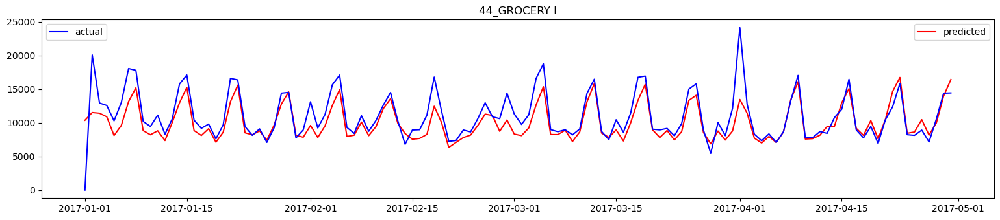

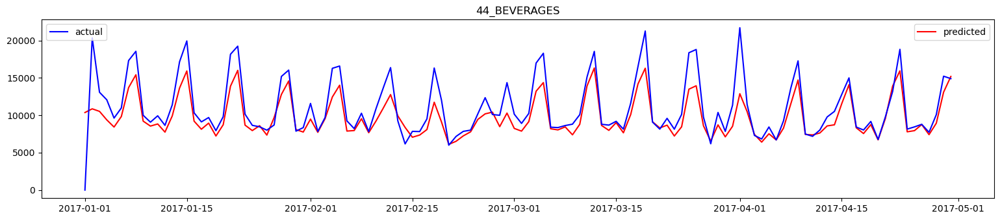

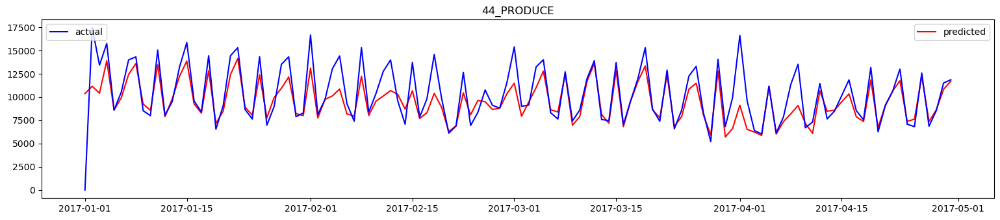

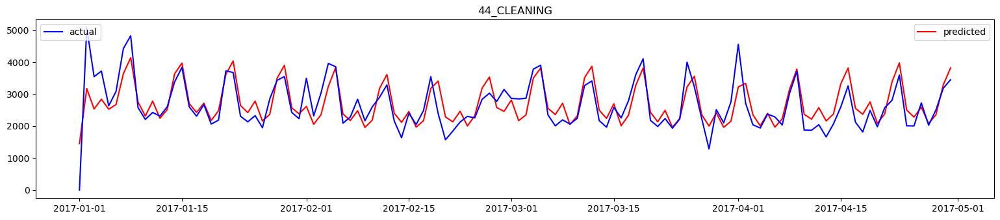

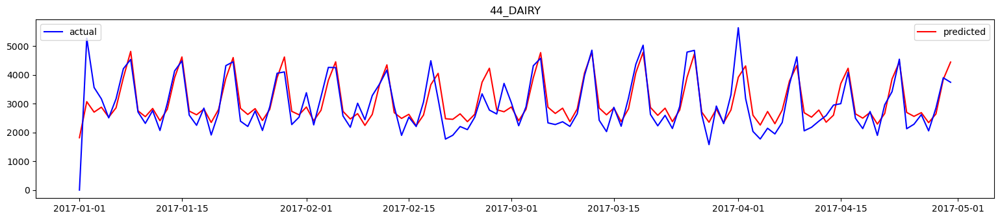

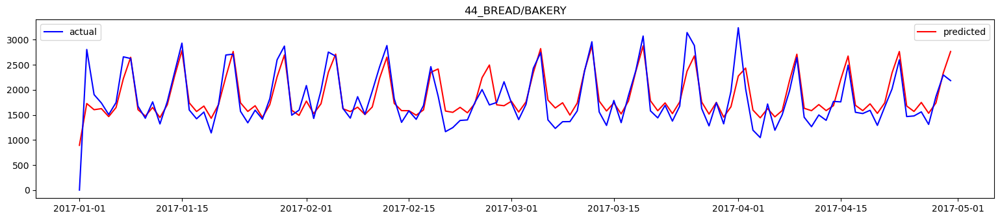

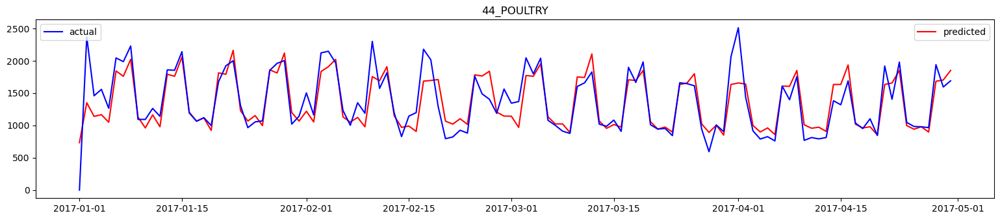

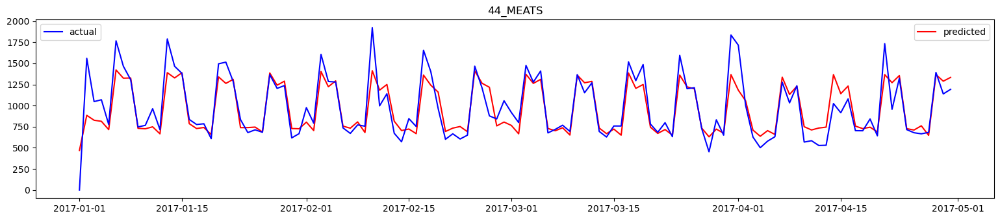

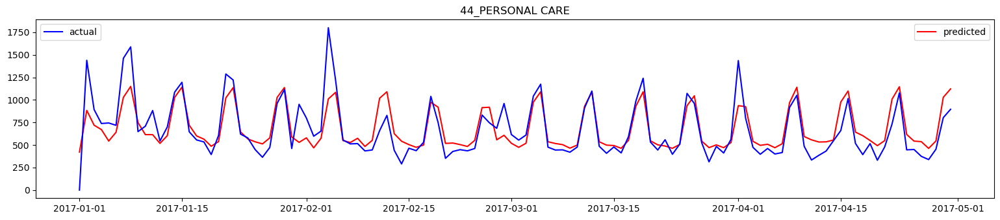

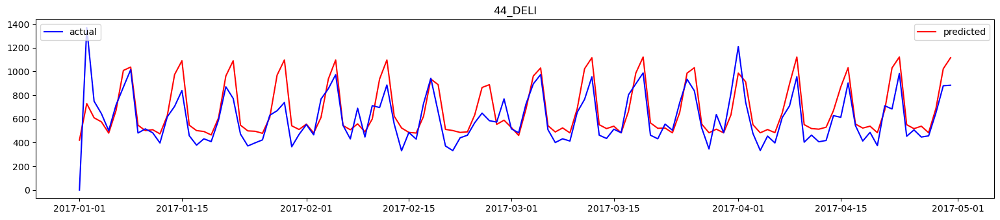

RMSE:  332.4342258694531
R2:  0.4100287061704269


In [575]:
rmse_list = []
r2_list = []
i = 0
for store in top_selling_strs:
    for fam in top_selling_fams[0:10]:
        store_fam = str(store) + '_' + fam
        store_fam_pred = (validate_actual_pred_df
                          .query(f'store_family=="{store_fam}"')
                          .sort_values(['store_family', 'ds'])
                         )
        rmse = (np.sqrt(mean_squared_error(store_fam_pred.y.values, 
                                           store_fam_pred.prediction.values)))
        # y_test = list(targ_ts)
        r2 = r2_score(store_fam_pred.y.values, 
                                           store_fam_pred.prediction.values)
        rmse_list.append(rmse)
        r2_list.append(r2)
        # _pred_df = pd.DataFrame({'actual':list(targ_ts),
        #              'prediction':list(pred)})
        # _pred_df['store_family'] = train_list[i]
        # break
        # _pred_df['ds'] = dates_df['ds'].values
        # break
        # _pred_df = _pred_df.sort_values('ds')
        # break
        if i<10:
            plt.rcParams["figure.figsize"] = [15.50, 3.50]
            plt.rcParams["figure.autolayout"] = True
            line1, = plt.plot(store_fam_pred['ds'], store_fam_pred['prediction'], '-r', label='predicted')
            line2, = plt.plot(store_fam_pred['ds'], store_fam_pred['y'], '-b', label='actual')
            first_legend = plt.legend(handles=[line1], loc='upper right')
            plt.gca().add_artist(first_legend)
            plt.legend(handles=[line2], loc='upper left')
            plt.title(str(store)+ '_' + fam)
            plt.show()
            
        i = i + 1
    # break
print('RMSE: ', np.mean(rmse_list))
print('R2: ', np.mean(r2_list))